<a href="https://colab.research.google.com/github/Menkallinan/digital-image-processing/blob/main/project/project_part6/Classificador.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!git clone https://github.com/Menkallinan/digital-image-processing

Cloning into 'digital-image-processing'...
remote: Enumerating objects: 688, done.
remote: Counting objects: 100% (279/279), done.
remote: Compressing objects: 100% (229/229), done.
remote: Total 688 (delta 32), reused 220 (delta 14), pack-reused 409 (from 1)
Receiving objects: 100% (688/688), 605.94 MiB | 26.74 MiB/s, done.
Resolving deltas: 100% (36/36), done.
Updating files: 100% (329/329), done.


In [33]:
import os
import shutil

# Diretórios de origem
source_dirs = [
    "digital-image-processing/project/project_part1",
    "digital-image-processing/project/project_part3/augmented_dataset"
]

# Diretório de destino
destination_dir = "digital-image-processing/project/project_part6/images"

# Cria o diretório de destino se ele não existir
os.makedirs(destination_dir, exist_ok=True)

# Percorre os diretórios de origem
for source_dir in source_dirs:
    # Percorre as pastas dentro do diretório de origem
    for folder_name in os.listdir(source_dir):
        folder_path = os.path.join(source_dir, folder_name)
        # Verifica se é uma pasta
        if os.path.isdir(folder_path):
          # Percorre os arquivos dentro da pasta, ou as subpastas dentro da pasta
          for item in os.listdir(folder_path):
            item_path = os.path.join(folder_path, item)
            # Verifica se é um arquivo
            if os.path.isfile(item_path) and item.endswith(".png"):
                source_path = item_path
                destination_path = os.path.join(destination_dir, item)
                # Copia o arquivo para o diretório de destino
                shutil.copy(source_path, destination_path)
            # Se for uma subpasta, percorre os arquivos dentro dela
            elif os.path.isdir(item_path):
              for filename in os.listdir(item_path):
                if filename.endswith(".png"):
                  source_path = os.path.join(item_path, filename)
                  destination_path = os.path.join(destination_dir, filename)
                  # Copia o arquivo para o diretório de destino
                  shutil.copy(source_path, destination_path)

# Abordagem 1

**Extraindo feature vector das imagens com bounding box e usando apenas essas imagens no classificador**

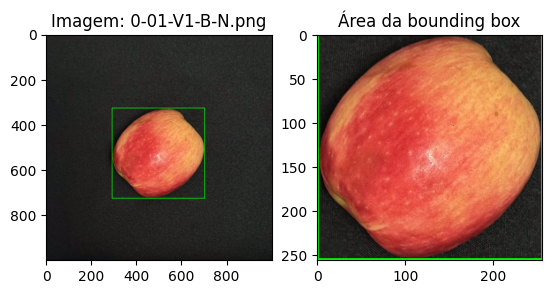

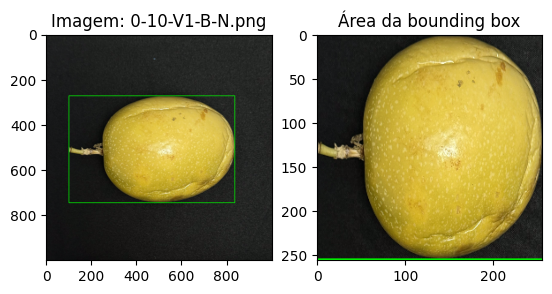

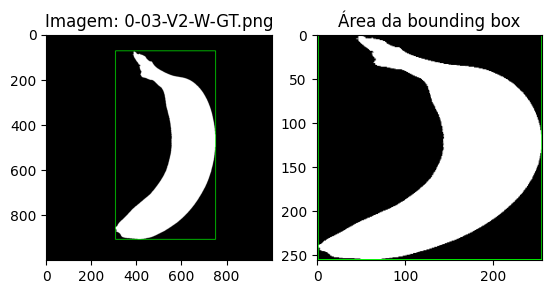

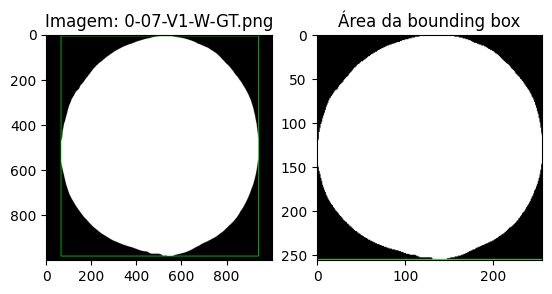

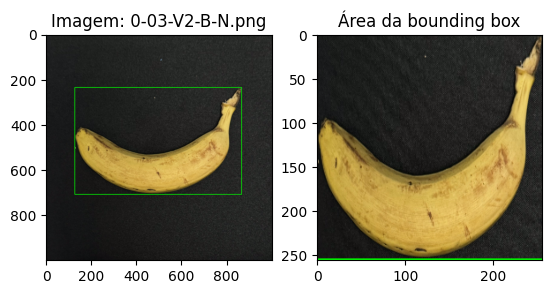

...

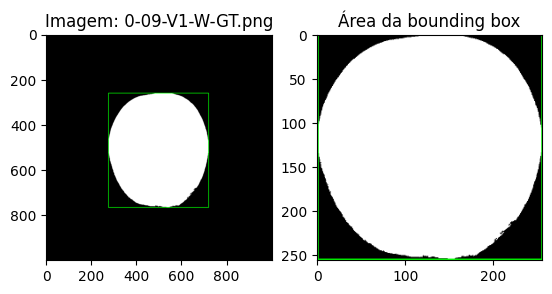

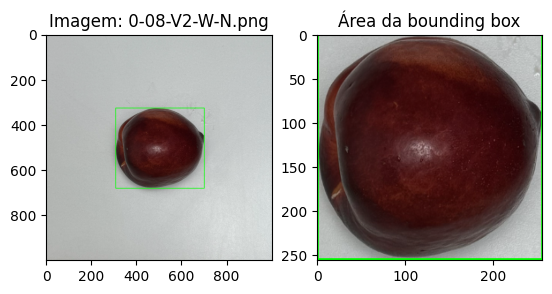

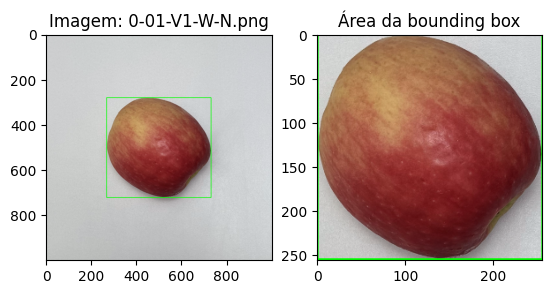

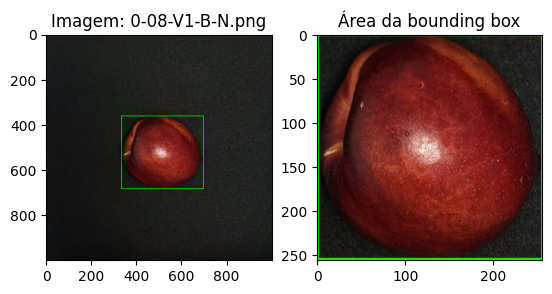

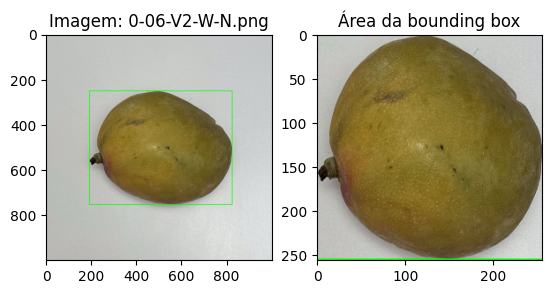

Relatório de Classificação (Validação)
               precision    recall  f1-score   support

        apple       0.00      0.00      0.00         0
       banana       1.00      1.00      1.00         2
        lemon       0.50      0.25      0.33         4
        mango       1.00      0.67      0.80         3
        melon       0.57      1.00      0.73         4
       orange       1.00      1.00      1.00         1
passion-fruit       1.00      0.50      0.67         2

     accuracy                           0.69        16
    macro avg       0.72      0.63      0.65        16
 weighted avg       0.77      0.69      0.69        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Matriz de Confusão (Teste)
[[2 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 0 2 0 0 0 0 0]
 [0 0 0 2 0 1 0 0]
 [0 0 0 0 1 0 0 1]
 [0 0 0 0 0 2 0 0]
 [0 0 0 0 0 0 2 0]
 [1 0 0 0 0 0 0 1]]
Relatório de Classificação (Teste)
               precision    recall  f1-score   support

        apple       0.67      1.00      0.80         2
      avocado       1.00      1.00      1.00         1
       banana       1.00      1.00      1.00         2
        lemon       1.00      0.67      0.80         3
        mango       1.00      0.50      0.67         2
        melon       0.67      1.00      0.80         2
    nectarine       1.00      1.00      1.00         2
passion-fruit       0.50      0.50      0.50         2

     accuracy                           0.81        16
    macro avg       0.85      0.83      0.82        16
 weighted avg       0.85      0.81      0.81        16



In [46]:
import numpy as np
import os
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import random

IMAGE_DATA_PATH = "digital-image-processing/project/project_part6/bounding_box_fruits/"

classes = {
    "01": "apple",
    "02": "avocado",
    "03": "banana",
    "04": "guava",
    "05": "lemon",
    "06": "mango",
    "07": "melon",
    "08": "nectarine",
    "09": "orange",
    "10": "passion-fruit"
}

#Feature vector
gray_vector = [] #Dados em escala de cinza
mean_vector = [] #Média dos dados de cada imagem (média dos pixels)
label_vector = [] #Rótulo de cada imagem

#Função para detectar a bounding box (quadrado verde) e recortar
def extract_bounding_box(image):
    #Converte a imagem para o espaço de cor HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    #Define o intervalo de cor verde para isolar a bounding box
    lower_green = np.array([40, 40, 40])
    upper_green = np.array([80, 255, 255])

    #Máscara para a cor verde
    mask = cv2.inRange(hsv, lower_green, upper_green)

    #Encontra contornos para detectar a bounding box
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #Se houver contornos, pega o maior (bounding box)
    if contours:
        c = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(c)

        #Cortar a área da fruta
        fruit_region = image[y:y+h, x:x+w]
        return fruit_region
    return None

#Carrega as imagens e extrai o feature vector
for filename in os.listdir(IMAGE_DATA_PATH):
    if filename.endswith(".png"):
        file_path = IMAGE_DATA_PATH + filename
        image = cv2.imread(file_path)

        fruit_region = extract_bounding_box(image) #Chama a função para recortar a região da fruta (bounding box)

        if fruit_region is not None:

            fruit_region = cv2.resize(fruit_region, (256, 256)) #Padroniza os recortes do bounding box em 256x256

            #Grayscale
            gray_image = cv2.cvtColor(fruit_region, cv2.COLOR_BGR2GRAY)
            gray_vector.append(gray_image.flatten())

            #Média
            mean_img = np.mean(fruit_region, axis=2)
            mean_vector.append(mean_img.flatten())

            #Adiciona a classe ao label_vector
            class_id = filename.split("-")[1]
            label = classes[class_id]
            label_vector.append(label)

            fig, axes = plt.subplots(1, 2)

            axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axes[0].set_title(f"Imagem: {filename}")

            axes[1].imshow(cv2.cvtColor(fruit_region, cv2.COLOR_BGR2RGB))
            axes[1].set_title("Área da bounding box")

            plt.show()

#Converte o feature vector em arrays NumPy
gray_vector_array = np.array(gray_vector)
mean_vector_array = np.array(mean_vector)
label_vector_array = np.array(label_vector)

#Concatena o feature vector em um único array NumPy
gray_mean_vectors_array = np.concatenate((gray_vector_array, mean_vector_array), axis=0)
label_vectors_array = np.concatenate((label_vector_array, label_vector_array), axis=0)

#Cria um dataframe com os feature vectors
data_frame = pd.DataFrame(gray_mean_vectors_array)
data_frame["Target"] = label_vectors_array

#Separa o feature vector
X = data_frame.iloc[:, :-1]
y = data_frame.iloc[:, -1]

#Divide 90% para treino/validação e 10% para teste
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

#Dividir 80% para treino e 10% para validação (dentro dos 90% já separados)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.1111, random_state=42) #0.1111 é usado para garantir que o conjunto de validação seja 10% do total (10% de 90%).

#print(f"Tamanho do conjunto de treinamento: {X_train.shape}")
#print(f"Tamanho do conjunto de validação: {X_val.shape}")
#print(f"Tamanho do conjunto de teste: {X_test.shape}")

svclassifier = SVC(kernel="linear") #Cria o classificador SVM com kernel linear

svclassifier.fit(X_train, y_train) #Treina o classificador

y_val_pred = svclassifier.predict(X_val) #Validação

print("Relatório de Classificação (Validação)")
print(classification_report(y_val, y_val_pred))

y_test_pred = svclassifier.predict(X_test) #Teste

print("Matriz de Confusão (Teste)")
print(confusion_matrix(y_test, y_test_pred))

print("Relatório de Classificação (Teste)")
print(classification_report(y_test, y_test_pred))

#Selecionar algumas imagens aleatórias do conjunto de teste
#num_images = 5
#random_indices = np.random.choice(len(X_test), num_images)
#test_images = np.array([flat_data_arr_gray[i] for i in random_indices])
#test_labels = np.array([labels[i] for i in random_indices])
#test_features = X_test.iloc[random_indices]



#Fazer as previsões para as imagens selecionadas
#predictions = svclassifier.predict(test_features)

#Exibir as imagens com as classes previstas e reais
#for i in range(num_images):
    #image = test_images[i].reshape(256, 256)  # Reformatar para 2D para exibir
    #predicted_label = predictions[i]
    #true_label = test_labels[i]

    #Exibir a imagem usando matplotlib
    #plt.imshow(image, cmap='gray')
    #plt.title(f"Previsto: {predicted_label}, Real: {true_label}")
    #plt.show()

# Abordagem 2

**Gerando feature vector das imagens com bounding box, mas utilizando toda a base de imagens (base inicial de 40 imagens + augmented dataset de 120 imagens) no classificador (não utilizando imagens bounding box)**

In [41]:
import numpy as np
import os
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import random

BOUNDING_BOX_IMAGE_DATA_PATH = "digital-image-processing/project/project_part6/bounding_box_fruits/"

IMAGE_DATA_PATH = "digital-image-processing/project/project_part6/images/"

classes = {
    "01": "apple",
    "02": "avocado",
    "03": "banana",
    "04": "guava",
    "05": "lemon",
    "06": "mango",
    "07": "melon",
    "08": "nectarine",
    "09": "orange",
    "10": "passion-fruit"
}

#Feature vector das imagens bounding box
bounding_box_gray_vector = [] #Dados em escala de cinza
bounding_box_mean_vector = [] #Média dos dados de cada imagem (média dos pixels)
bounding_box_label_vector = [] #Rótulo de cada imagem

#Feature vector da base de imagens
gray_vector = [] #Dados em escala de cinza
mean_vector = [] #Média dos dados de cada imagem (média dos pixels)
label_vector = [] #Rótulo de cada imagem

#Função para detectar a bounding box (quadrado verde) e recortar
def extract_bounding_box(image):
    #Converte a imagem para o espaço de cor HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    #Define o intervalo de cor verde para isolar a bounding box
    lower_green = np.array([40, 40, 40])
    upper_green = np.array([80, 255, 255])

    #Máscara para a cor verde
    mask = cv2.inRange(hsv, lower_green, upper_green)

    #Encontra contornos para detectar a bounding box
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #Se houver contornos, pega o maior (bounding box)
    if contours:
        c = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(c)

        #Cortar a área da fruta
        fruit_region = image[y:y+h, x:x+w]
        return fruit_region
    return None

#Carrega as imagens bounding box e extrai o feature vector delas
for filename in os.listdir(BOUNDING_BOX_IMAGE_DATA_PATH):
    if filename.endswith(".png"):
        file_path = BOUNDING_BOX_IMAGE_DATA_PATH + filename
        image = cv2.imread(file_path)

        fruit_region = extract_bounding_box(image) #Chama a função para recortar a região da fruta (bounding box)

        if fruit_region is not None:

            fruit_region = cv2.resize(fruit_region, (256, 256)) #Padroniza os recortes do bounding box em 256x256

            #Grayscale
            gray_image = cv2.cvtColor(fruit_region, cv2.COLOR_BGR2GRAY)
            bounding_box_gray_vector.append(gray_image.flatten())

            #Média
            mean_img = np.mean(fruit_region, axis=2)
            bounding_box_mean_vector.append(mean_img.flatten())

            #Adiciona a classe ao label_vector
            class_id = filename.split("-")[1]
            label = classes[class_id]
            bounding_box_label_vector.append(label)

#Converte o feature vector em arrays NumPy
bounding_box_gray_vector_array = np.array(bounding_box_gray_vector)
bounding_box_mean_vector_array = np.array(bounding_box_mean_vector)
bounding_box_label_vector_array = np.array(bounding_box_label_vector)

#Concatena o feature vector em um único array NumPy
bounding_box_gray_mean_vectors_array = np.concatenate((bounding_box_gray_vector_array, bounding_box_mean_vector_array), axis=0)
bounding_box_label_vectors_array = np.concatenate((bounding_box_label_vector_array, bounding_box_label_vector_array), axis=0)

#Cria um dataframe com o feature vector
bounding_box_data_frame = pd.DataFrame(bounding_box_gray_mean_vectors_array)
bounding_box_data_frame["Target"] = bounding_box_label_vectors_array

#Separa o feature vector
bounding_box_X = bounding_box_data_frame.iloc[:, :-1]
bounding_box_y = bounding_box_data_frame.iloc[:, -1]

#Carrega a base de imagens e extrai o feature vector delas
for filename in os.listdir(IMAGE_DATA_PATH):
    if filename.endswith(".png"):
        file_path = IMAGE_DATA_PATH + filename

        image = cv2.imread(file_path)

        image = cv2.resize(image, (256, 256))

        #Grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        gray_vector.append(gray_image.flatten())

        #Média
        mean_img = np.mean(image, axis=2)
        mean_vector.append(mean_img.flatten())

        #Adiciona a classe ao label_vector
        class_id = filename.split("-")[1]
        label = classes[class_id]
        label_vector.append(label)

#Converte o feature vector em arrays NumPy
gray_vector_array = np.array(gray_vector)
mean_vector_array = np.array(mean_vector)
label_vector_array = np.array(label_vector)

#Concatena o feature vector em um único array NumPy
gray_mean_vectors_array = np.concatenate((gray_vector_array, mean_vector_array), axis=0)
label_vectors_array = np.concatenate((label_vector_array, label_vector_array), axis=0)

#Cria um dataframe com o feature vector
data_frame = pd.DataFrame(gray_mean_vectors_array)
data_frame["Target"] = label_vectors_array

#Separa o feature vector
X = data_frame.iloc[:, :-1]
y = data_frame.iloc[:, -1]

#Divide 90% para treino/validação e 10% para teste
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

#Dividir 80% para treino e 10% para validação (dentro dos 90% já separados)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.1111, random_state=42) #0.1111 é usado para garantir que o conjunto de validação seja 10% do total (10% de 90%).

#print(f"Tamanho do conjunto de treinamento: {X_train.shape}")
#print(f"Tamanho do conjunto de validação: {X_val.shape}")
#print(f"Tamanho do conjunto de teste: {X_test.shape}")

svclassifier = SVC(kernel="linear") #Cria o classificador SVM com kernel linear

svclassifier.fit(X_train, y_train) #Treina o classificador

y_val_pred = svclassifier.predict(X_val) #Validação

print("Relatório de Classificação (Validação)")
print(classification_report(y_val, y_val_pred))

y_test_pred = svclassifier.predict(X_test) #Teste

print("Matriz de Confusão (Teste)")
print(confusion_matrix(y_test, y_test_pred))

print("Relatório de Classificação (Teste)")
print(classification_report(y_test, y_test_pred))

Relatório de Classificação (Validação)
               precision    recall  f1-score   support

        apple       1.00      1.00      1.00         3
      avocado       1.00      1.00      1.00         1
       banana       1.00      1.00      1.00         5
        guava       1.00      1.00      1.00         1
        lemon       1.00      1.00      1.00         2
        mango       1.00      1.00      1.00         4
        melon       1.00      1.00      1.00         3
    nectarine       1.00      1.00      1.00         5
       orange       1.00      1.00      1.00         4
passion-fruit       1.00      1.00      1.00         4

     accuracy                           1.00        32
    macro avg       1.00      1.00      1.00        32
 weighted avg       1.00      1.00      1.00        32

Matriz de Confusão (Teste)
[[1 0 0 0 0 0 0 0 0 0]
 [0 4 0 0 0 0 0 0 0 0]
 [0 0 2 0 0 0 0 0 0 0]
 [0 0 0 3 0 0 0 0 0 0]
 [0 0 0 0 8 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 2 0 0 0]
